# Ames Real Estate Machine Learning Project


### Yi Cao, Daniel Choy, Ling Ge Zeng

### Objective: The first part of this project explores the characteristics of Ames housing market. The second part of this project includes a comparison of different regression models and assess their test performances

In [2]:
# Import Libraries
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns
import pandas as pd
import matplotlib as mpl
# import chart_studio.plotly as py
import numpy as np
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
# from geopy import Nominatim
# from geopy.extra.rate_limiter import RateLimiter
%matplotlib inline

In [3]:
# Run the file Data_Preprocessing.ipynb which cleaned the data. Pre-processed data are saved in the data file

housing = pd.read_csv('data/Ames_Housing_Price_Data.csv', index_col = 0)
real_estate = pd.read_csv('data/Ames_Real_Estate_Data.csv', index_col = 0)
# combined data set:
ames_df = pd.read_csv('data/final_df.csv', index_col = 0)

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (36,40,81,87) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


# Overview of Ames Housing Market

In [62]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df

,Neighborhood,geometry
0,City Center,"POLYGON ((-93.62326 42.06548, -93.62051 42.055..."
1,24th St / Grand Ave,"POLYGON ((-93.62068 42.04579, -93.64017 42.045..."
2,E 13th St / Duff Ave,"POLYGON ((-93.63476 42.03450, -93.63373 42.033..."
3,S Duff Ave / E Lincoln Way,"POLYGON ((-93.57141 42.02896, -93.61656 42.023..."
4,Grand Ave / 30th St,"POLYGON ((-93.64240 42.05643, -93.63450 42.045..."
5,Stange Rd / Pammel Ct,"POLYGON ((-93.64480 42.04540, -93.64480 42.035..."
6,Iowa State University,"POLYGON ((-93.65570 42.03450, -93.65630 42.034..."
7,Woodland St / West St,"POLYGON ((-93.65656 42.02819, -93.66840 42.028..."
8,Ontario,"POLYGON ((-93.69887 42.03457, -93.69905 42.022..."
9,Lincoln Way / 500th Ave,"POLYGON ((-93.69887 42.02245, -93.69879 42.014..."


In [132]:
neighborhood_new = []
for row in ames_df['Neighborhood']:
   if row == 'Blmngtn': neighborhood_new.append('Gilbert')
   if row == 'Blueste': neighborhood_new.append('Lincoln Way / State Ave')
   if row == 'BrDale': neighborhood_new.append('Grand Ave / 30th St')
   if row == 'BrkSide': neighborhood_new.append('E 13th St / Duff Ave')
   if row == 'ClearCr': neighborhood_new.append('Ontario')
   if row == 'CollgCr': neighborhood_new.append('Lincoln Way / 500th Ave')
   if row == 'Crawfor': neighborhood_new.append('S Duff Ave / E Lincoln Way')
   if row == 'Edwards': neighborhood_new.append('Woodland St / West St')
   if row == 'Gilbert': neighborhood_new.append('Gilbert')
   if row == 'IDOTRR' : neighborhood_new.append('S Duff Ave / E Lincoln Way')
   if row == 'MeadowV': neighborhood_new.append('S Duff Ave / Airport Rd')
   if row == 'Mitchel': neighborhood_new.append('S Duff Ave / Airport Rd')
   if row == 'NAmes': neighborhood_new.append('City Center')
   if row == 'NoRidge': neighborhood_new.append('Gilbert')
   if row == 'NPkVill': neighborhood_new.append('Grand Ave / 30th St')
   if row == 'NridgHt': neighborhood_new.append('Gilbert')
   if row == 'NWAmes': neighborhood_new.append('24th St / Grand Ave')
   if row == 'OldTown': neighborhood_new.append('E 13th St / Duff Ave')
   if row == 'SWISU': neighborhood_new.append('Lincoln Way / State Ave')
   if row == 'Sawyer': neighborhood_new.append('Ontario')
   if row == 'SawyerW': neighborhood_new.append('Ontario')
   if row == 'Somerst' : neighborhood_new.append('Grand Ave / 30th St')
   if row == 'StoneBr': neighborhood_new.append('Grand Ave / 30th St')
   if row == 'Timber': neighborhood_new.append('S Duff Ave / Airport Rd')
   if row == 'Veenker': neighborhood_new.append('Stange Rd / Pammel Ct')
   if row == 'Greens': neighborhood_new.append('Stange Rd / Pammel Ct')
ames_df['Neighborhood_New'] = neighborhood_new

In [133]:
ames_df2 = ames_df.copy()

## Ames House Sale Price Distribution

Text(0, 0.5, 'Density')

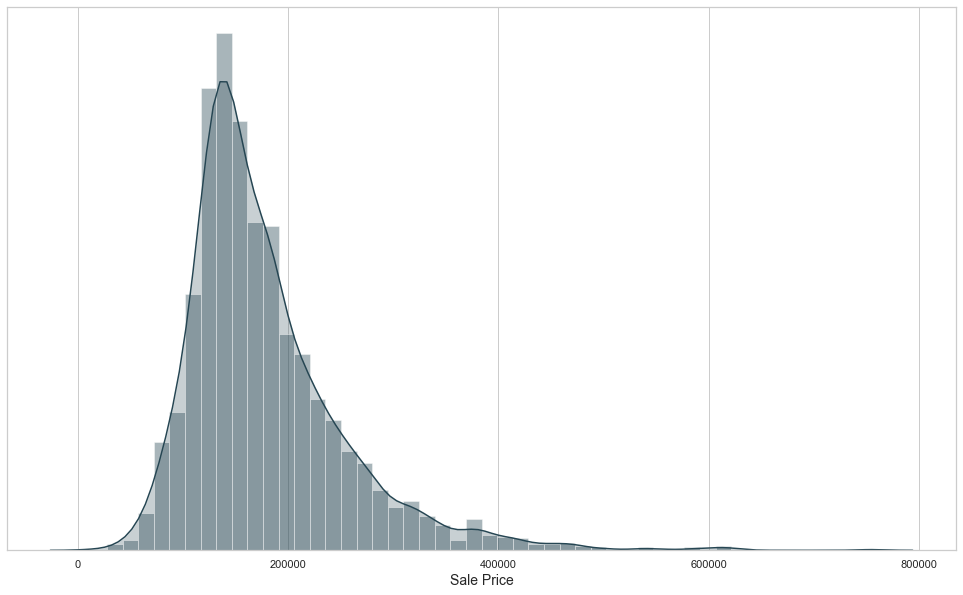

In [146]:
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
plt.figure(figsize = (17,10))
ax = sns.distplot(ames_df['SalePrice'], kde = True, kde_kws = {'shade': True})
plt.xlabel('Sale Price', fontdict = {'fontsize' : 14})
ax.axes.get_yaxis().set_visible(False)
plt.ylabel('Density', fontdict = {'fontsize' : 14})

#### The distribution graph indicates that Ames housing market has more outliers on the expensive side

## Ames Housing Market Trend

In [120]:
ames_df2['PrPerAbvGrSF'] = ames_df2['SalePrice']/ames_df2['GrLivArea']
ames_df['PrPerAbvGrSF'] = ames_df['SalePrice']/ames_df['GrLivArea']
ames_df2['PrPerAbvGrSF'].dtypes
pd.to_datetime(ames_df2['YrSold'], format = '%Y')
ames_df2[['YrSold']]

,YrSold
0,2010
1,2009
3,2007
4,2009
5,2009
...,...
2598,2009
2599,2009
2600,2007
2601,2007


In [13]:
ames_df2['YrSold'].dtypes
ames_df2['YrSold'] = pd.to_datetime(ames_df2['YrSold'], format = '%Y')
ames_df2['YrSold'].dtypes
ames_df2['year'] = pd.DatetimeIndex(ames_df2['YrSold']).year
ames_df2['year'].dtypes
ames_df2['year'] = ames_df2.year.astype(str)
MedPrPerAbvGrSF = ames_df2.groupby('year')[['PrPerAbvGrSF']].mean().reset_index()

Text(0, 0.5, 'Sale Price per Square Feet')

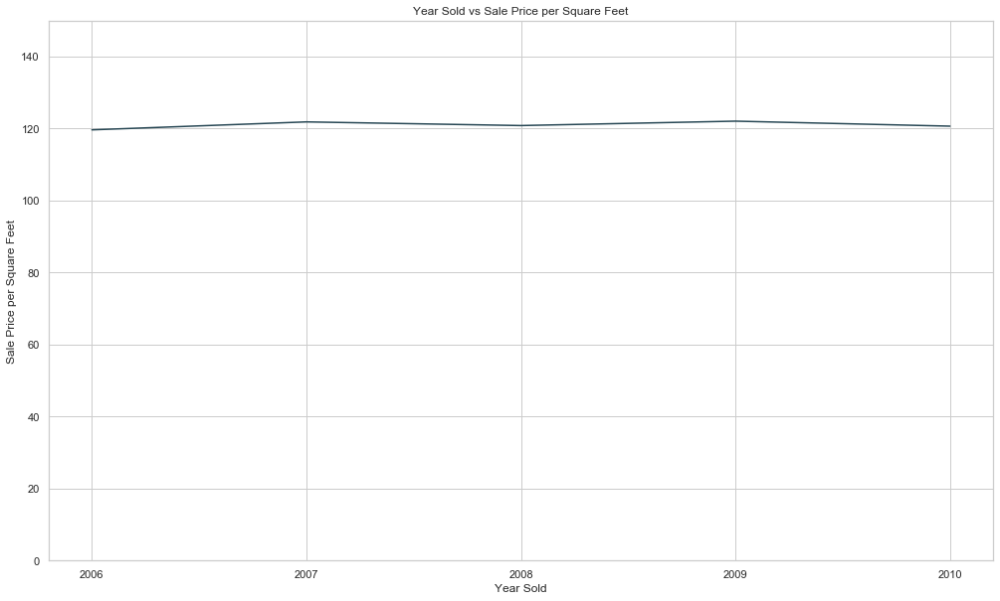

In [67]:
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

fig, ax1 = plt.subplots(figsize=(17,10))
sns.lineplot(MedPrPerAbvGrSF['year'], MedPrPerAbvGrSF['PrPerAbvGrSF'])
plt.ylim(0, 150)
ax1.set_title('Year Sold vs Sale Price per Square Feet', fontsize=12)
ax1.set_xlabel('Year Sold', fontsize=12)
ax1.set_ylabel('Sale Price per Square Feet', fontsize=12)


#### Ames housing market is relatively stable in terms of per square foot pricing over the years

## Ames Housing Market Overview by Price

In [123]:

nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()
Q1 = np.percentile(ames_df2['SalePrice'], 25, interpolation = 'midpoint')
Q2 = np.percentile(ames_df2['SalePrice'], 50, interpolation = 'midpoint')
Q3 = np.percentile(ames_df2['SalePrice'], 75, interpolation = 'midpoint')
IQR = Q3 - Q1
print(Q1)
print(Q2)
print(Q3)
print(IQR)
print(IQR + Q3)

130000.0
159975.0
209750.0
79750.0
289500.0


In [129]:
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()
Q1 = np.percentile(ames_df2['PrPerAbvGrSF'], 25, interpolation = 'midpoint')
Q2 = np.percentile(ames_df2['PrPerAbvGrSF'], 50, interpolation = 'midpoint')
Q3 = np.percentile(ames_df2['PrPerAbvGrSF'], 75, interpolation = 'midpoint')
IQR = Q3 - Q1
print(Q1)
print(Q2)
print(Q3)
print(Q3 + IQR)

100.5887355495326
119.76384498845812
138.9547130068457
177.32069046415882


In [119]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()
Q1 = np.percentile(ames_df2['SalePrice'], 25, interpolation = 'midpoint')
Q2 = np.percentile(ames_df2['SalePrice'], 50, interpolation = 'midpoint')
Q3 = np.percentile(ames_df2['SalePrice'], 75, interpolation = 'midpoint')
IQR = Q3 - Q1

SalePrice_new = []
for row in ames_df2['SalePrice']:
    if row < 100.5887355495326.0 : SalePrice_new.append('$')
    elif row < 119.76384498845812 : SalePrice_new.append('$$')
    elif row < 138.9547130068457 : SalePrice_new.append('$$$')
    elif row < 196.50367919281535 : SalePrice_new.append('$$$$')
    else : SalePrice_new.append('$$$$$')
ames_df2['price_type'] = SalePrice_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='$')
feature_2 = folium.FeatureGroup(name='$$')
feature_3 = folium.FeatureGroup(name='$$$')
feature_4 = folium.FeatureGroup(name='$$$$')
feature_5 = folium.FeatureGroup(name='$$$$$')

for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['price_type'], v['Neighborhood'], v['SalePrice'])
    
    if v['price_type'] == '$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['price_type'] == '$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['price_type'] == '$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['price_type'] == '$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)
    elif v['price_type'] == '$$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e76f51',
                            fill_color='#e76f51',
                            fill=True).add_to(feature_5)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
feature_5.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)

locs_map

## Ames Housing Market Overview by Price per Square Feet

In [130]:

SalePrice_new = []
for row in ames_df2['PrPerAbvGrSF']:
    if row < 100.5887355495326 : SalePrice_new.append('$')
    elif row < 119.76384498845812 : SalePrice_new.append('$$')
    elif row < 138.9547130068457 : SalePrice_new.append('$$$')
    elif row < 177.32069046415882 : SalePrice_new.append('$$$$')
    else : SalePrice_new.append('$$$$$')
ames_df2['price_type2'] = SalePrice_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='$')
feature_2 = folium.FeatureGroup(name='$$')
feature_3 = folium.FeatureGroup(name='$$$')
feature_4 = folium.FeatureGroup(name='$$$$')
feature_5 = folium.FeatureGroup(name='$$$$$')

for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['price_type2'], v['Neighborhood'], v['PrPerAbvGrSF'])
    
    if v['price_type2'] == '$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['price_type2'] == '$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['price_type2'] == '$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['price_type2'] == '$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)
    elif v['price_type2'] == '$$$$$':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e76f51',
                            fill_color='#e76f51',
                            fill=True).add_to(feature_5)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
feature_5.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)

locs_map

## Building Type in Ames

In [159]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()

SalePrice_new = []
for row in ames_df2['BldgType']:
    if row == '1Fam' : SalePrice_new.append('1 Family Detached')
    elif row == 'TwnhsE' : SalePrice_new.append('Townhouse End Unit')
    elif row == 'Twnhs': SalePrice_new.append('Townhouse Inner Unit')
    elif row == 'Duplex' : SalePrice_new.append('Duplex')
    else : SalePrice_new.append('2-Family Conversion')
ames_df2['building_type'] = SalePrice_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='1 Family Detached')
feature_2 = folium.FeatureGroup(name='Townhouse End Unit')
feature_3 = folium.FeatureGroup(name='Townhouse Inner Unit')
feature_4 = folium.FeatureGroup(name='Duplex')
feature_5 = folium.FeatureGroup(name='2-Family Conversion')

for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['building_type'], v['Neighborhood'], v['SalePrice'])
    
    if v['building_type'] == '1 Family Detached':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['building_type'] == 'Townhouse End Unit':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['building_type'] == 'Townhouse Inner Unit':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['building_type'] == 'Duplex':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)
    elif v['building_type'] == '2-Family Conversion':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e76f51',
                            fill_color='#e76f51',
                            fill=True).add_to(feature_5)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
feature_5.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)
locs_map

# Break it down into different categories

#### 1. Neighborhood

#### 2. House Size

#### 3. House Age

#### 4. House Features

#### 5. Other Features

## Neighborhood

In [134]:
ames_df3 = ames_df2.groupby(['Neighborhood_New'])['SalePrice', 'total_LivArea'].mean().reset_index()
ames_df3
ames_geo_mean_df = pd.merge(nbh_geo_df, ames_df3, left_on = 'Neighborhood', right_on='Neighborhood_New')
ames_geo_mean_df
ames_geo_mean_df['price_per_sf'] = ames_geo_mean_df['SalePrice'] / ames_geo_mean_df['total_LivArea']
ames_geo_mean_df

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,Neighborhood,geometry,Neighborhood_New,SalePrice,total_LivArea,price_per_sf
0,City Center,"POLYGON ((-93.62326 42.06548, -93.62051 42.055...",City Center,145088.911765,1501.590686,96.623476
1,24th St / Grand Ave,"POLYGON ((-93.62068 42.04579, -93.64017 42.045...",24th St / Grand Ave,190372.398374,2175.439024,87.509876
2,E 13th St / Duff Ave,"POLYGON ((-93.63476 42.03450, -93.63373 42.033...",E 13th St / Duff Ave,126361.691318,1421.948553,88.865164
3,S Duff Ave / E Lincoln Way,"POLYGON ((-93.57141 42.02896, -93.61656 42.023...",S Duff Ave / E Lincoln Way,161250.127273,1675.781818,96.223820
4,Grand Ave / 30th St,"POLYGON ((-93.64240 42.05643, -93.63450 42.045...",Grand Ave / 30th St,219469.561181,1990.291139,110.270079
5,Stange Rd / Pammel Ct,"POLYGON ((-93.64480 42.04540, -93.64480 42.035...",Stange Rd / Pammel Ct,236364.516129,2563.161290,92.216013
6,Woodland St / West St,"POLYGON ((-93.65656 42.02819, -93.66840 42.028...",Woodland St / West St,132040.619632,1523.349693,86.677813
7,Ontario,"POLYGON ((-93.69887 42.03457, -93.69905 42.022...",Ontario,168014.944828,1818.420690,92.396081
8,Lincoln Way / 500th Ave,"POLYGON ((-93.69887 42.02245, -93.69879 42.014...",Lincoln Way / 500th Ave,198133.169492,1976.525424,100.243168
9,Lincoln Way / State Ave,"POLYGON ((-93.65905 42.02252, -93.65888 42.007...",Lincoln Way / State Ave,135032.352941,1631.019608,82.790147


## Sale Price per Square Feet by Neighborhood

In [135]:
from branca.colormap import linear
nbh_count_colormap2 = linear.YlGnBu_09.scale(min(ames_geo_mean_df['price_per_sf']),
                                            max(ames_geo_mean_df['price_per_sf']))

nbh_locs_map2 = folium.Map(location=[42.045042, -93.6473567],
                          zoom_start = 11.5, tiles='cartodbpositron')

style_function = lambda x: {
    'fillColor': nbh_count_colormap2(x['properties']['price_per_sf']),
    'color': 'black',
    'weight': 2,
    'fillOpacity': 0.7
}

folium.GeoJson(
    ames_geo_mean_df,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood_New', 'price_per_sf'],
        aliases=['Neighborhood', 'Sales Price per Square Feet'],
        localize=True
    )
).add_to(nbh_locs_map2)

nbh_count_colormap2.add_to(nbh_locs_map2)
nbh_count_colormap2.caption = 'Ames Housing Sale Price per Square Feet by Neighborhood'
nbh_count_colormap2.add_to(nbh_locs_map2)
folium.map.CustomPane('labels').add_to(nbh_locs_map2)
folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(nbh_locs_map2)
nbh_locs_map2

#### Most expensive houses are concentrated in northern part of Ames 

## Ames House Average Sale Price by Neighborhood

In [22]:
from branca.colormap import linear
nbh_count_colormap = linear.YlGnBu_09.scale(min(ames_df3['SalePrice']),
                                            max(ames_df3['SalePrice']))

nbh_locs_map = folium.Map(location=[42.045042, -93.6473567],
                          zoom_start = 11.5, tiles='cartodbpositron')

style_function = lambda x: {
    'fillColor': nbh_count_colormap(x['properties']['SalePrice']),
    'color': 'black',
    'weight': 2,
    'fillOpacity': 0.7
}

folium.GeoJson(
    ames_geo_mean_df,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood_New', 'SalePrice'],
        aliases=['Neighborhood_New', 'Sales Price Mean Value'],
        localize=True
    )
).add_to(nbh_locs_map)

nbh_count_colormap.add_to(nbh_locs_map)
nbh_count_colormap.caption = 'Ames Housing Sale Price by Neighborhood'
nbh_count_colormap.add_to(nbh_locs_map)
folium.map.CustomPane('labels').add_to(nbh_locs_map)
folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(nbh_locs_map)
nbh_locs_map

## Distance from Iowa State University vs Sale Price

Text(0, 0.5, 'Sale Price per Square Feet')

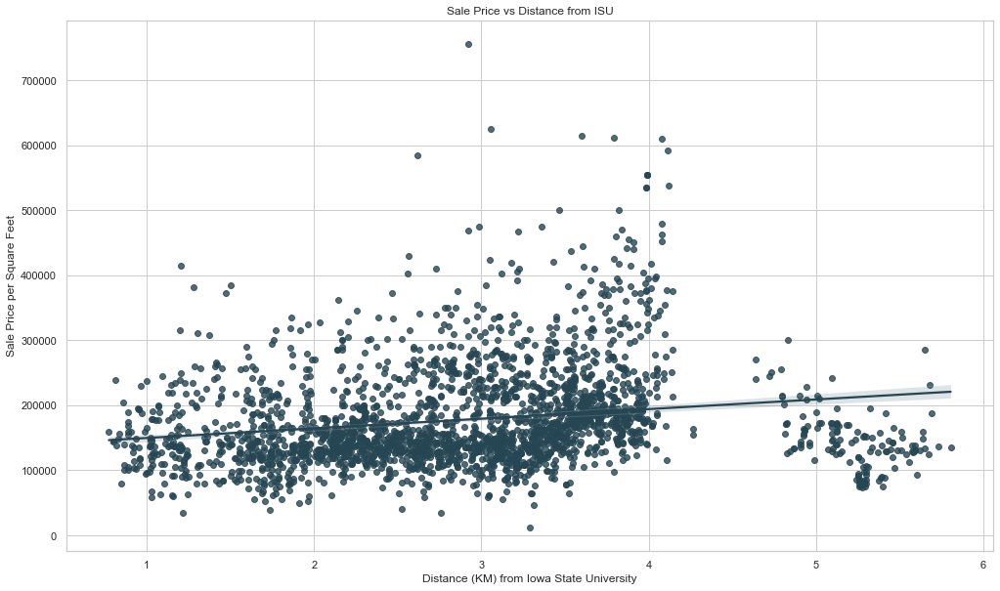

In [68]:
sns.set_style("whitegrid")

colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
fig, ax1 = plt.subplots(figsize=(17,10))
sns.regplot(x = 'Distance', y = 'SalePrice', data = ames_df2)
ax1.set_title('Sale Price vs Distance from ISU', fontsize=12)
ax1.set_xlabel('Distance (KM) from Iowa State University', fontsize=12)
ax1.set_ylabel('Sale Price per Square Feet', fontsize=12)

## Distance from Iowa State University vs Sale Price


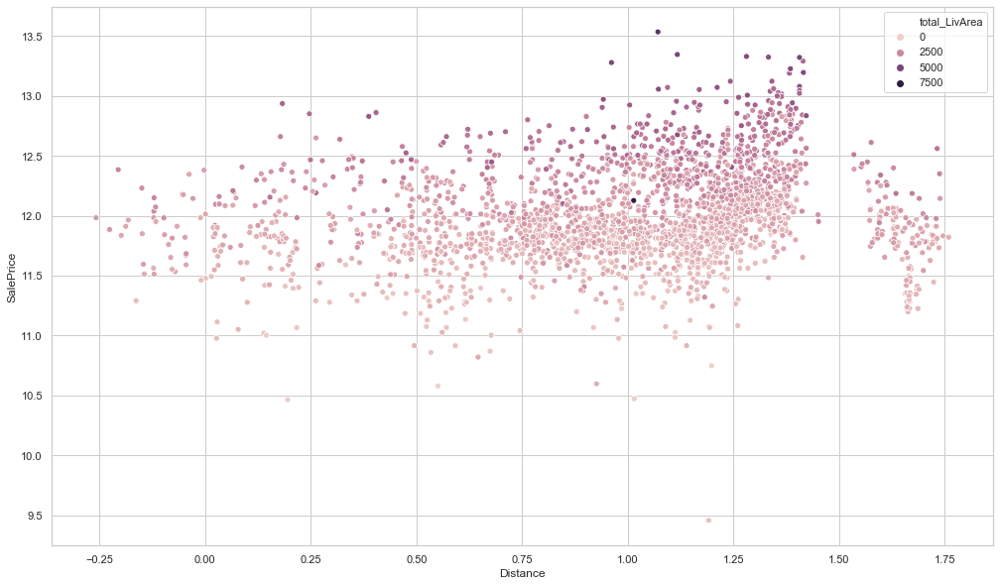

In [69]:
# Distance VS Sale Price
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
plt.figure(figsize = (17,10))
log_distance = np.log(ames_df['Distance'])
log_SalePrice= np.log(ames_df['SalePrice'])
sns.scatterplot(x = log_distance, y = log_SalePrice, hue = 'total_LivArea', data = ames_df2)

# House Size

## Total Living Area vs Sale Price

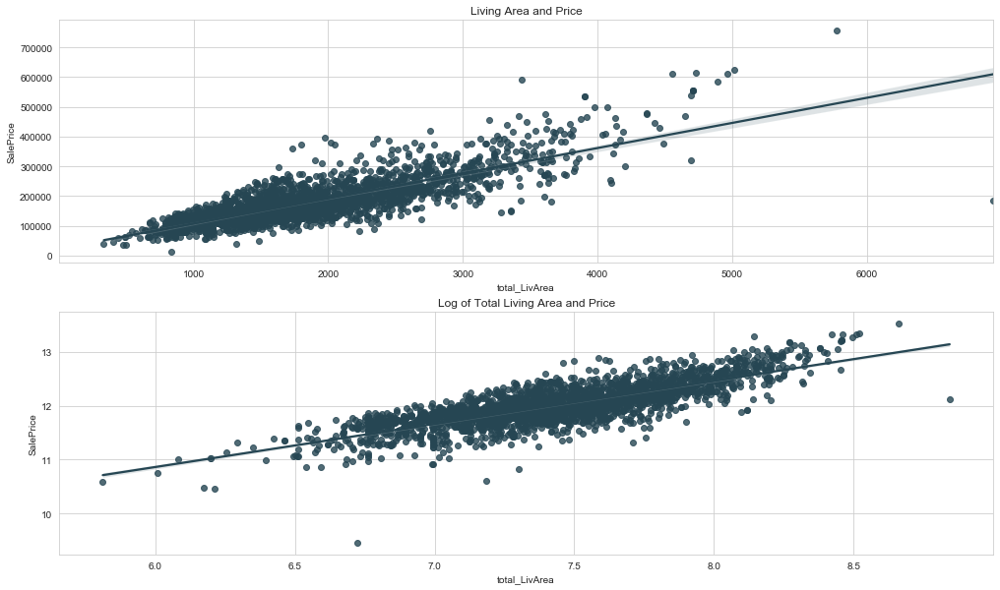

In [4]:
X = np.log(ames_df['total_LivArea']) 
Y = np.log(ames_df['SalePrice'])

plt.figure(figsize = (17,10))
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

ax1 = plt.subplot(2,1,2).set_title("Log of Total Living Area and Price")
sns.regplot(x = X, y = Y, data = ames_df)

ax2 = plt.subplot(2,1,1).set_title("Living Area and Price")
sns.regplot(x = 'total_LivArea', y = 'SalePrice', data = ames_df)

#### Larger living area leads to higher sale price; in addition, the impact of living area on sale price wanes off as the living area continues to increase.

## Living Area vs Sale Price

In [159]:
X = np.log(ames_df['1stFlrSF']) 
Y = np.log(ames_df['SalePrice'])

XX = np.log(ames_df['2ndFlrSF']) 
YY = np.log(ames_df['SalePrice'])

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/numpy/core/function_base.py:153: RuntimeWarning: invalid value encountered in multiply
  y *= step
/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/numpy/core/function_base.py:163: RuntimeWarning: invalid value encountered in add
  y += start
/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/numpy/linalg/linalg.py:1965: RuntimeWarning: invalid value encountered in greater
  large = s > cutoff


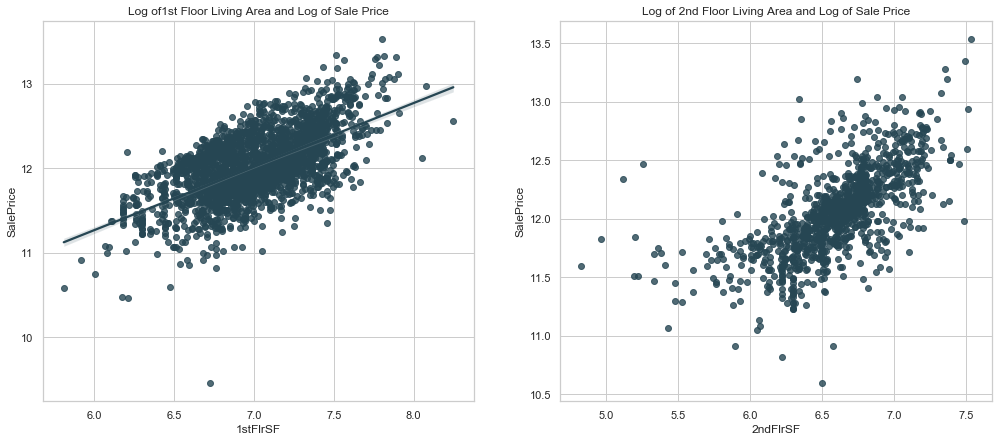

In [162]:
plt.figure(figsize = (17,7))
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

ax1 = plt.subplot(1,2,1).set_title("Log of1st Floor Living Area and Log of Sale Price")
sns.regplot(x = X, y = Y, data = ames_df)

ax2 = plt.subplot(1,2,2).set_title("Log of 2nd Floor Living Area and Log of Sale Price")
sns.regplot(x = XX, y = Y, data = ames_df)

# House Age

## Age Characteristics of Houses at Ames  

In [75]:
import geopandas as gpd
nbh_geo_df = gpd.read_file('data/map.geojson', driver='GeoJSON')
nbh_geo_df
ames_df2 = ames_df.copy()
Q1 = np.percentile(ames_df2['age_building'], 25, interpolation = 'midpoint')
Q2 = np.percentile(ames_df2['age_building'], 50, interpolation = 'midpoint')
Q3 = np.percentile(ames_df2['age_building'], 75, interpolation = 'midpoint')
IQR = Q3 - Q1

building_age_new = []
for row in ames_df2['age_building']:
    if row < 5 : building_age_new.append('New')
    elif row < 16 : building_age_new.append('Fairly New')
    elif row < 42 : building_age_new.append('Fairly Old')
    else : building_age_new.append('Old')
ames_df2['age_building_new'] = building_age_new

from shapely.geometry import Point, shape

locs_geometry = [Point(xy) for xy in zip(ames_df2.longitude2,
                                         ames_df2.latitude2)]

crs = {'init': 'epsg:4326'}
# Coordinate Reference Systems, "epsg:4326" is a common projection of WGS84 Latitude/Longitude
locs_gdf = gpd.GeoDataFrame(ames_df2, crs=crs, geometry=locs_geometry)

import folium
locs_map = folium.Map(location=[42.045042, -93.6473567],
                      zoom_start=13, tiles='cartodbpositron')

feature_1 = folium.FeatureGroup(name='New')
feature_2 = folium.FeatureGroup(name='Fairly New')
feature_3 = folium.FeatureGroup(name='Fairly Old')
feature_4 = folium.FeatureGroup(name='Old')


for i, v in locs_gdf.iterrows():
    popup = """
    Location id : <b>%s</b><br>
    Room type : <b>%s</b><br>
    Neighbourhood : <b>%s</b><br>
    Price : <b>%d</b><br>
    """ % (v['PID'], v['age_building_new'], v['Neighborhood'], v['age_building'])
    
    if v['age_building_new'] == 'New':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#264653',
                            fill_color='#264653',
                            fill=True).add_to(feature_1)
    elif v['age_building_new'] == 'Fairly New':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#2a9d8f',
                            fill_color='#2a9d8f',
                            fill=True).add_to(feature_2)
    elif v['age_building_new'] == 'Fairly Old':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#e9c46a',
                            fill_color='#e9c46a',
                            fill=True).add_to(feature_3)
    elif v['age_building_new'] == 'Old':
        folium.CircleMarker(location=[v['latitude2'], v['longitude2']],
                            radius=2,
                            tooltip=popup,
                            color='#f4a261',
                            fill_color='#f4a261',
                            fill=True).add_to(feature_4)

feature_1.add_to(locs_map)
feature_2.add_to(locs_map)
feature_3.add_to(locs_map)
feature_4.add_to(locs_map)
folium.LayerControl(collapsed=False).add_to(locs_map)
locs_map

## Year Built vs Sale Price

Text(0, 0.5, 'Sale Price')

<Figure size 1224x720 with 0 Axes>

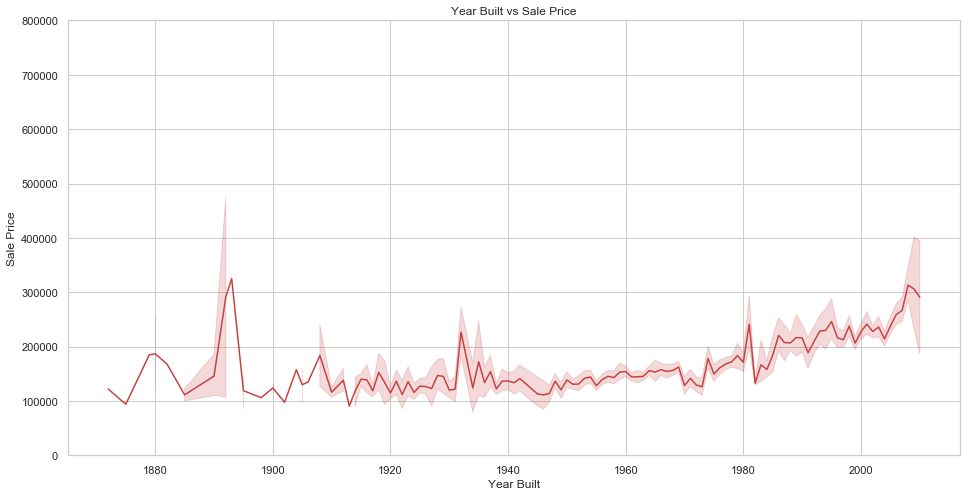

In [71]:
sns.set_style("whitegrid")
var = 'YearBuilt'
plt.figure(figsize = (17,10))
data = pd.concat([housing['SalePrice'], housing[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.lineplot(x=var, y="SalePrice", data=data, color = '#c64242')
fig.axis(ymin=0, ymax=800000);
ax.set_title('Year Built vs Sale Price', fontsize=12)
ax.set_xlabel('Year Built', fontsize=12)
ax.set_ylabel('Sale Price', fontsize=12)

#### Recently built houses are relatively more expensive

In [72]:
from ames_function import feature_eng
house_df_eng = feature_eng(ames_df)
ames_df['effective_age'] = ames_df['YrSold'] - ames_df['YearRemodAdd']
ames_df['actual_age'] = ames_df['YrSold'] - ames_df['YearBuilt']

## Effective House Age vs Sale Price

(1, 62)

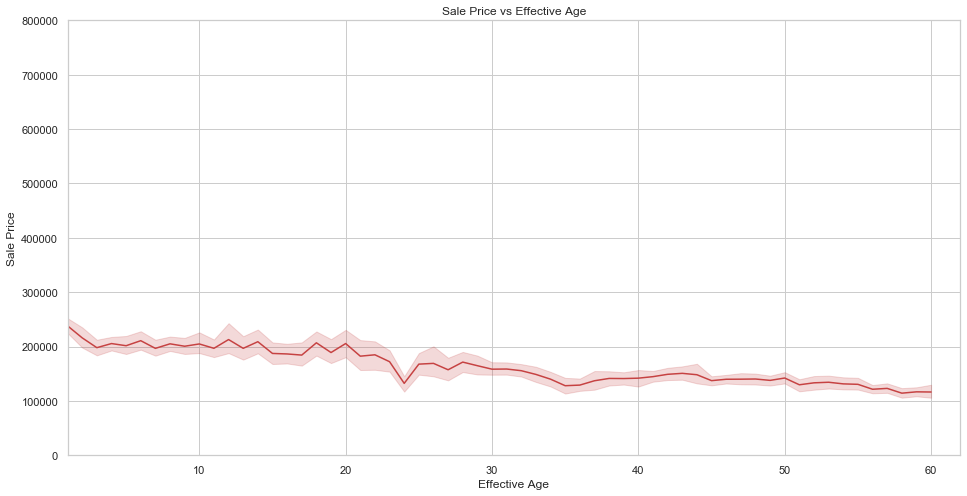

In [73]:
sns.set_style("whitegrid")
var = 'effective_age'
data = pd.concat([ames_df['SalePrice'], ames_df[var]], axis=1)
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.lineplot(x=var, y="SalePrice", data=data, color = '#c64242')
fig.axis(ymin=0, ymax=800000)
ax.set_title('Sale Price vs Effective Age', fontsize=12)
ax.set_xlabel('Effective Age', fontsize=12)
ax.set_ylabel('Sale Price', fontsize=12)
plt.xlim(1, 62)

#### Effective house age is calculated as Year Sold - Year Remodeled. The lower the effective age, the more expensive houses are. This indicates that there is an investment opportunity for home flippers to make profit in Ames. 

## Actual Age vs Sale Price

Text(0, 0.5, 'Sale Price')

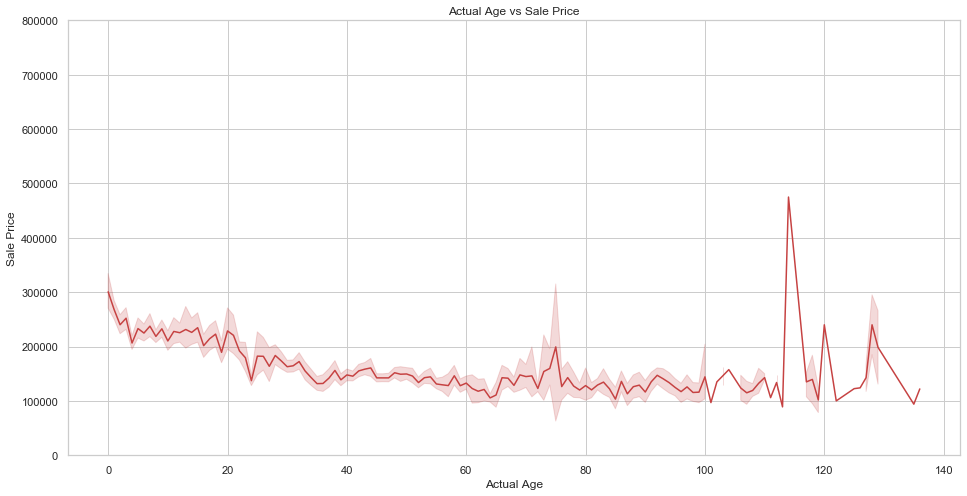

In [74]:
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize=(16, 8))
fig = sns.lineplot(x='actual_age', y="SalePrice", data=ames_df, color = '#c64242')
fig.axis(ymin=0, ymax=800000)
ax.set_title('Actual Age vs Sale Price', fontsize=12)
ax.set_xlabel('Actual Age', fontsize=12)
ax.set_ylabel('Sale Price', fontsize=12)

#### Actual age is calculated as Year Sold - Year Built. If we exclude the outlier, newer houses have a higher selling price. 

In [98]:
ames_df2['effective_age'] = ames_df2['YrSold'] - ames_df2['YearRemodAdd']
ames_df2['actual_age'] = ames_df2['YrSold'] - ames_df2['YearBuilt']
ames_df4 = ames_df2.groupby(['Neighborhood_New'])['effective_age', 'actual_age'].mean().reset_index()
ames_geo_mean_df2 = pd.merge(nbh_geo_df, ames_df4, left_on = 'Neighborhood', right_on='Neighborhood_New')
ames_geo_mean_df2

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  This is separate from the ipykernel package so we can avoid doing imports until


,Neighborhood,geometry,Neighborhood_New,effective_age,actual_age
0,City Center,"POLYGON ((-93.62326 42.06548, -93.62051 42.055...",City Center,37.134940,47.780723
1,24th St / Grand Ave,"POLYGON ((-93.62068 42.04579, -93.64017 42.045...",24th St / Grand Ave,27.483871,32.145161
2,E 13th St / Duff Ave,"POLYGON ((-93.63476 42.03450, -93.63373 42.033...",E 13th St / Duff Ave,34.746835,82.167722
3,S Duff Ave / E Lincoln Way,"POLYGON ((-93.57141 42.02896, -93.61656 42.023...",S Duff Ave / E Lincoln Way,35.134503,69.994152
4,Grand Ave / 30th St,"POLYGON ((-93.64240 42.05643, -93.63450 42.045...",Grand Ave / 30th St,10.962963,11.497942
5,Stange Rd / Pammel Ct,"POLYGON ((-93.64480 42.04540, -93.64480 42.035...",Stange Rd / Pammel Ct,20.806452,26.129032
6,Woodland St / West St,"POLYGON ((-93.65656 42.02819, -93.66840 42.028...",Woodland St / West St,33.149701,51.227545
7,Ontario,"POLYGON ((-93.69887 42.03457, -93.69905 42.022...",Ontario,24.116041,33.436860
8,Lincoln Way / 500th Ave,"POLYGON ((-93.69887 42.02245, -93.69879 42.014...",Lincoln Way / 500th Ave,9.175000,10.570833
9,Lincoln Way / State Ave,"POLYGON ((-93.65905 42.02252, -93.65888 42.007...",Lincoln Way / State Ave,39.745098,66.803922


## Average House Age by Neighborhood

In [153]:
import folium
from branca.colormap import linear


nbh_count_colormap3 = linear.YlGnBu_09.scale(min(ames_geo_mean_df2['effective_age']),
                                            max(ames_geo_mean_df2['effective_age']))

nbh_locs_map3 = folium.Map(location=[42.045042, -93.6473567],
                          zoom_start = 11.5, tiles='cartodbpositron')

style_function = lambda x: {
    'fillColor': nbh_count_colormap2(x['properties']['effective_age']),
    'color': 'black',
    'weight': 2,
    'fillOpacity': 0.7
}

folium.GeoJson(
    ames_geo_mean_df2,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Neighborhood_New', 'effective_age'],
        aliases=['Neighborhood', 'Sales Price per Square Feet'],
        localize=True
    )
).add_to(nbh_locs_map3)

nbh_count_colormap3.add_to(nbh_locs_map3)
nbh_count_colormap3.caption = 'Average Effective House Age by Neighborhood'
nbh_count_colormap3.add_to(nbh_locs_map3)
folium.map.CustomPane('labels').add_to(nbh_locs_map3)
folium.TileLayer('CartoDBPositronOnlyLabels',
                 pane='labels').add_to(nbh_locs_map3)
nbh_locs_map3

# House Features

## Basement

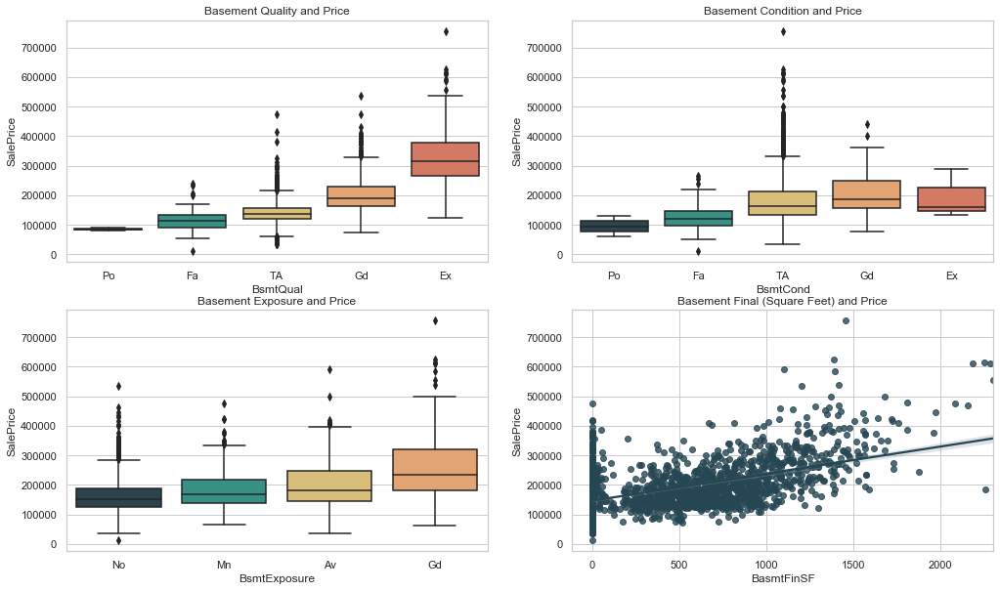

In [75]:
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))


plt.figure(figsize = (17,10))

plt.subplot(2,2,1).set_title("Basement Quality and Price")
sns.boxplot(x = 'BsmtQual', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = housing)

plt.subplot(2,2,2).set_title("Basement Condition and Price")
sns.boxplot(x = 'BsmtCond', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = housing)

plt.subplot(2,2,3).set_title("Basement Exposure and Price")
sns.boxplot(x = 'BsmtExposure', y = 'SalePrice', order=["No","Mn","Av","Gd"], data = housing)

plt.subplot(2,2,4).set_title("Basement Final (Square Feet) and Price")
sns.regplot(x = 'BasmtFinSF', y = 'SalePrice', data = housing)

#### Greater quality and greater size of the basement are related to higher sale price. 

## Kitchen

Text(0, 0.5, 'Sale Price')

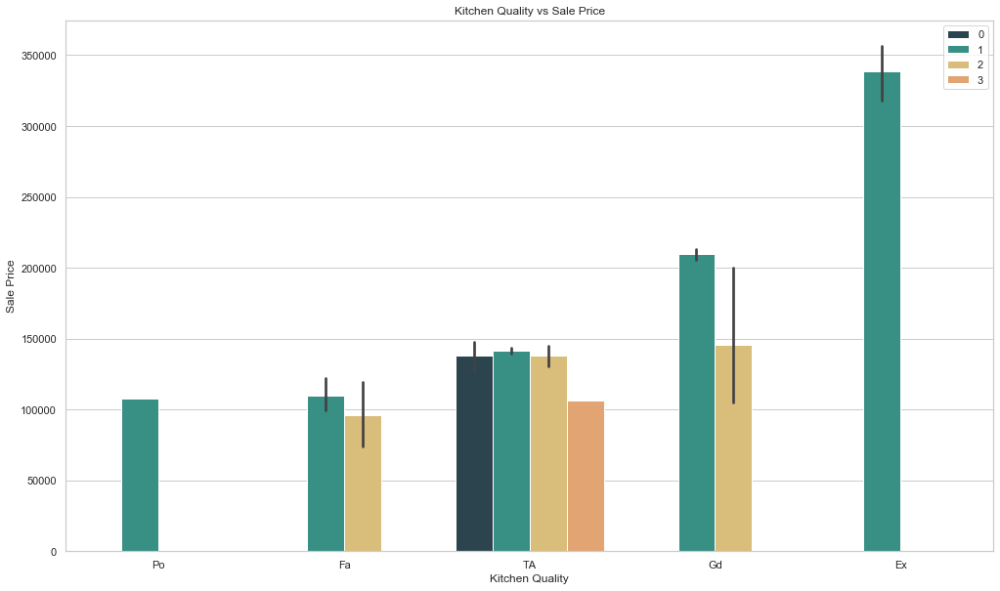

In [87]:
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))
fig, ax1 = plt.subplots(figsize = (17,10))
sns.barplot(x = 'KitchenQual', y = 'SalePrice', data = ames_df, \
            order=["Po","Fa","TA","Gd", "Ex"], hue = 'KitchenAbvGr').legend(loc='upper right')
ax1.set_title('Kitchen Quality vs Sale Price', fontsize=12)
ax1.set_xlabel('Kitchen Quality', fontsize=12)
ax1.set_ylabel('Sale Price', fontsize=12)

- Higher kitchen quality could increase house price
- Price has no significant difference in number of kitchen with same quality.

## Garage

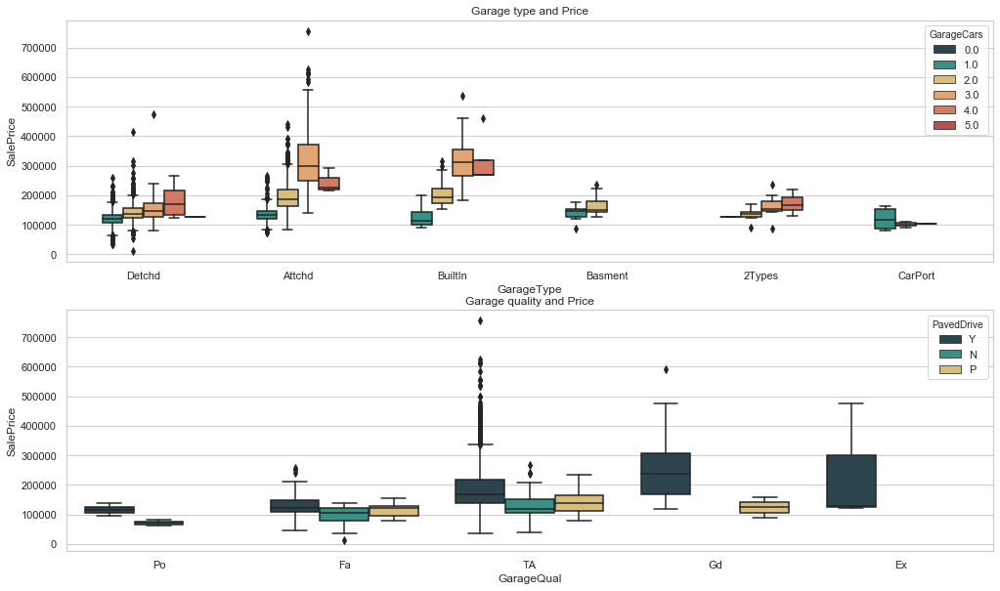

In [77]:
plt.figure(figsize = (17,10))
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#c64242"]
sns.set_palette(sns.color_palette(colors))

plt.subplot(2,1,1).set_title("Garage type and Price")
sns.boxplot(x = 'GarageType', y = 'SalePrice', hue = 'GarageCars',\
            data = ames_df)

plt.subplot(2,1,2).set_title("Garage quality and Price")
sns.boxplot(x = 'GarageQual', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], hue = 'PavedDrive',\
            data = ames_df)

- Garage with good and excellent quality, they do have paved drive way and higher house price
- Paved drive way has higher house price compare to no paved for the same garage quality

## Bathroom

Text(0, 0.5, 'Sale Price')

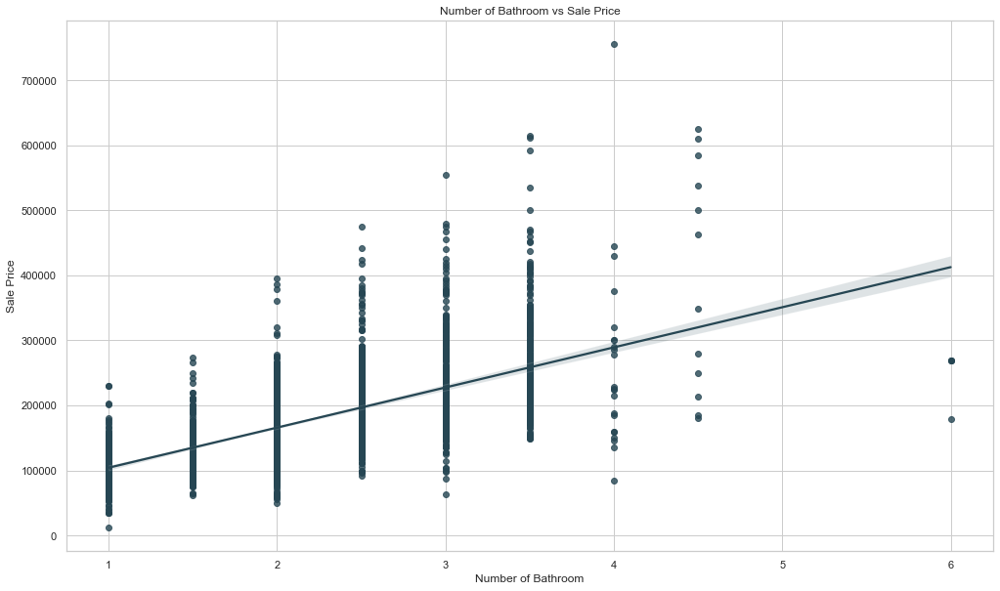

In [88]:
sns.set_style("whitegrid")
fig, ax1 = plt.subplots(figsize=(17,10))
sns.regplot(x = 'num_bathroom', y = 'SalePrice', color = '#264653', data = housing)
ax1.set_title('Number of Bathroom vs Sale Price', fontsize=12)
ax1.set_xlabel('Number of Bathroom', fontsize=12)
ax1.set_ylabel('Sale Price', fontsize=12)

#### The graph shows that there is a relationship between number of bathrooms and sale price

# Other Interior Features:

## Electricity, Heating, Central Air, and Fireplace

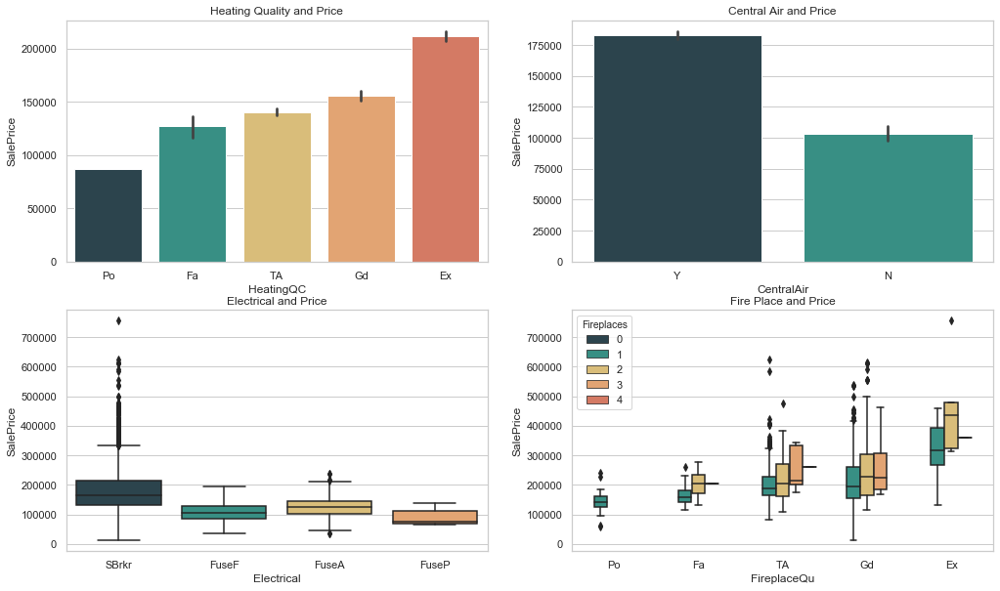

In [89]:
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51"]
sns.set_palette(sns.color_palette(colors))

plt.figure(figsize = (17,10))

plt.subplot(2,2,1).set_title("Heating Quality and Price")
sns.barplot(x = 'HeatingQC', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = ames_df)

plt.subplot(2,2,2).set_title("Central Air and Price")
sns.barplot(x = 'CentralAir', y = 'SalePrice', data = housing)

plt.subplot(2,2,3).set_title("Electrical and Price")
sns.boxplot(x = 'Electrical', y = 'SalePrice', data = housing)

plt.subplot(2,2,4).set_title("Fire Place and Price")
sns.boxplot(x = 'FireplaceQu', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], hue = 'Fireplaces',\
            data = ames_df)

- Having better heating quality is related to higher sale price
- Having central air is related to higher sale price
- Having more and having better quality of fire place is related to higher sale price

# Other Exterior Features

 ### Land Slope, Building Type, Porch, Roof Style

/Users/danielchoy/opt/anaconda3/lib/python3.7/site-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


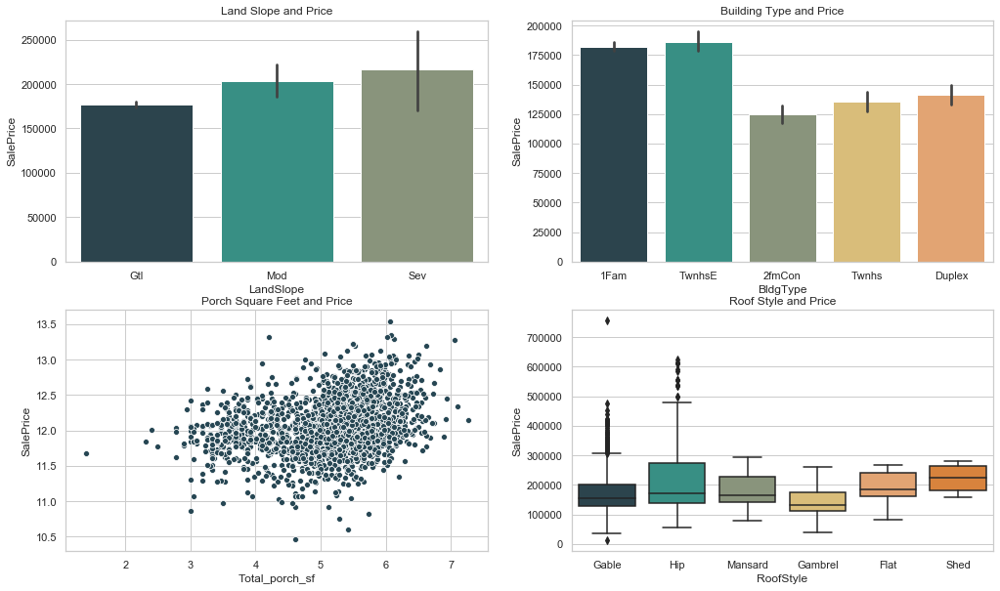

In [90]:
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#899878","#e9c46a", "#f4a261", "#F28123", "#e76f51","#563F1B"]
sns.set_palette(sns.color_palette(colors))


log_porch = np.log(ames_df['Total_porch_sf'])
log_SalePrice= np.log(ames_df['SalePrice'])

plt.figure(figsize = (17,10))



plt.subplot(2,2,1).set_title("Land Slope and Price")
sns.barplot(x = 'LandSlope', y = 'SalePrice', data = ames_df)

plt.subplot(2,2,2).set_title("Building Type and Price")
sns.barplot(x = 'BldgType', y = 'SalePrice', data = ames_df)

plt.subplot(2,2,3).set_title("Porch Square Feet and Price")
sns.scatterplot(x = log_porch, y = log_SalePrice, data = ames_df)

plt.subplot(2,2,4).set_title("Roof Style and Price")
sns.boxplot(x = 'RoofStyle', y = 'SalePrice', data = ames_df)

- Houses that are on the steeper hill seem to be more expensive
- End-unit town houses seem to be significantly more expensive than in-unit town houses
- Duplexes are more expensive than 2 family conversion
- Houses with a shed roof style are associated with higher median sale price
- Houses with greater porch area is associated with higher sale price

# Exterior Condition and Quality

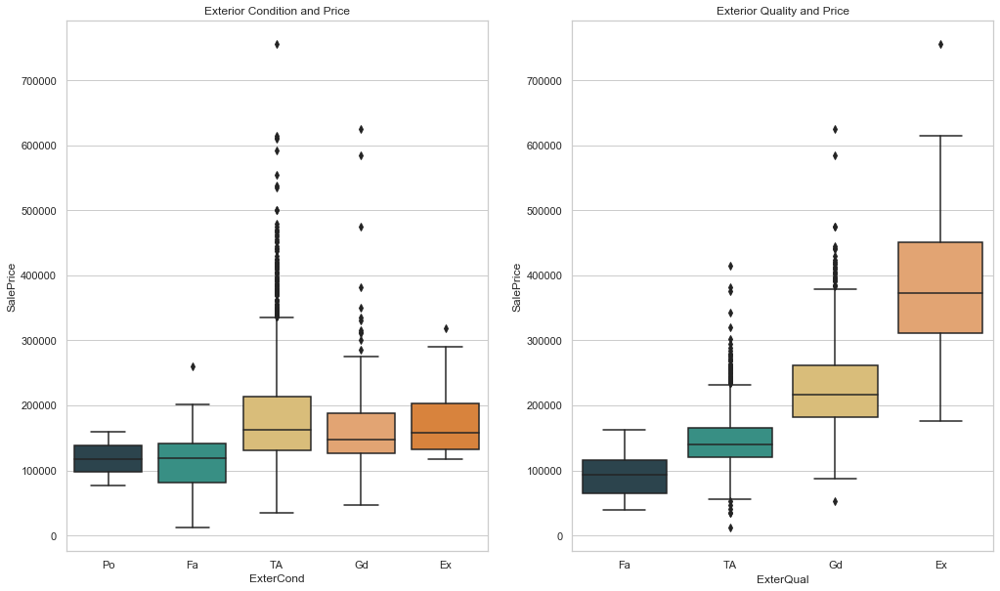

In [148]:
sns.set_style("whitegrid")
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#F28123", "#e76f51","#563F1B"]
sns.set_palette(sns.color_palette(colors))

plt.figure(figsize = (17,10))


plt.subplot(1,2,1).set_title("Exterior Condition and Price")
sns.boxplot(x = 'ExterCond', y = 'SalePrice', order=["Po","Fa","TA","Gd", "Ex"], data = ames_df)

plt.subplot(1,2,2).set_title("Exterior Quality and Price")
sns.boxplot(x = 'ExterQual', y = 'SalePrice', order=["Fa","TA","Gd", "Ex"], data = ames_df)

In [92]:
from sklearn.linear_model import LinearRegression, Ridge, RidgeCV, Lasso, LassoCV, ElasticNet, ElasticNetCV, HuberRegressor
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict,cross_validate, GridSearchCV, train_test_split
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor 
import statistics
import matplotlib.pyplot as plt
import seaborn as sns

In [93]:
ames_df = pd.read_csv('./data/final_df.csv', index_col = 0)

# Checking final_df after generating geoCode, found duplicated observations
ames_df.shape

(2603, 179)

In [94]:
# drop duplicated observations
ames_df = ames_df.drop_duplicates(subset=['PID'],keep = 'first')
ames_df.shape

(2558, 179)

In [95]:
ames_df_use = ames_df.copy()

# convert MSSubClass to str
ames_df_use['MSSubClass'] = ames_df_use[['MSSubClass']].astype('str')

# characterize tax distr and sch distr
ames_df_use['TxD_S'] = ames_df_use[['TxD_S']].astype('str')
ames_df_use['SchD_S'] = ames_df_use[['SchD_S']].astype('str')

# convert NA's to 0s in LotFrontage and Alley
ames_df_use['LotFrontage'] = np.where(pd.isnull(ames_df_use['LotFrontage']), 0, ames_df_use['LotFrontage'])
ames_df_use['Alley'] = np.where(pd.isnull(ames_df_use['Alley']), 0, 1)

# Impute None to Nan value in columns
none_features = ['FireplaceQu','GarageType','GarageFinish','GarageQual','GarageCond','Fence','BsmtQual','BsmtCond']
for feature in none_features:
    ames_df_use[feature] = ames_df_use[feature].fillna('None')

# drop rows with NA garage car / garage area
garage_NA_index = ames_df_use.loc[pd.isnull(ames_df_use['GarageArea'])].index
ames_df_use = ames_df_use.drop(garage_NA_index,axis=0)

# add in proper bathroom numbers for 918 and 2328
ames_df_use.at[918, 'num_bathroom'] = 1
ames_df_use.at[2328, 'num_bathroom'] = 3.5

# remove unnecessary columns
ames_df_use = ames_df_use.drop(
    ['PA-PreD','PA-PostD','PA-UnTyp','PA-UntNo','X1TPr_D','X1TSc_D','Rcrd_Mo','Legal_Pr','TxD_S',\
    'X2TPr_D','X2TSc_D','X1TPr_S','X1TSc_S','X2TPr_S','X2TSc_S','ISU_lat_long','address','MA_Ownr1','MA_Ownr2',\
    'MA_Line1','MA_Line2','MA_City','MA_State','address3','location2','point2','SaleCond','Source','Date',\
    'ParType','BldgNo_S','DwlgNo_S','YrBuilt','Ext1','Ext2','GLA','GarYrBlt','Cars','MA_Zip1','MA_Zip2',\
    'ZngCdPr','ZngCdSc','ZngOLPr','ZngOLSc','PA-Nmbr','PA-Strt','PA-StSfx','Inst1_No','Inst1_Yr','Inst1_Mo',\
    'Inst1TPr','TtlVal_AsrYr','ValType','OthAc_S','ImpAc_S','LndAc_S','Prop_Addr','HSTtl_D','MilVal_D',\
    'HSTtl_S','MilVal_S','GeoRefNo','Tier','Range','AcreX_S1','ClassPr_S','ClassSc_S','LndAcX1S','ImpAcX1S',\
    'Central Air','ImpAcX2S','AcreGr','AcreNt_S','ParclRel','Rcrd_Yr','address2','SaleType',\
    'latitude2','longitude2','ISU_lat','ISU_long','altitude2','Central Air',\

    'index','MiscVal','YrSold_YYYY','MoSold_MM','PoolArea','PoolQC','MiscFeature','Street','PID','Utilities',\
    'BsmtHalfBath2','FullBath','HalfBath','TtlBsmtSF','HalfBath2','BsmtFullBath','BsmtHalfBath',\
    'BsmtFinSF1','BsmtFinSF2','BsmtFinType1','BsmtFinType2','BsmtUnfSF','LowQualFinSF','BasmtFinSF2','BasmtFinSF1',\
    'GrLivArea','1stFlrSF','2ndFlrSF','BedroomAbvGr','MasVnrType','MasVnrArea','GarageArea2','PoolArea2','NmbrBRs',\
    'Neighborhood','TotalBsmtSF','GarageYrBlt','BasmtFinSF','Heating'],\
    axis=1)

print(ames_df_use.columns)
print(f'has null: {ames_df_use.columns[ames_df_use.isnull().sum() > 0]}')

Index(['SalePrice', 'Distance', 'MSSubClass', 'MSZoning', 'LotFrontage',
       'LotArea', 'Alley', 'LotShape', 'LandContour', 'LotConfig', 'LandSlope',
       'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'HeatingQC', 'CentralAir',
       'Electrical', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd',
       'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'Fence', 'MoSold', 'YrSold', 'SaleCondition',
       'MasVnrArea2', 'total_LivArea', 'num_bathroom', 'SchD_S'],
      dtype='object')
has null: Index(['BsmtExposure', 'Electrical'], dtype='object')


In [96]:
ames_df_use.YrSold.value_counts()

2007    595
2009    576
2008    561
2006    511
2010    314
Name: YrSold, dtype: int64

In [97]:
# one way ANOVA test
SalePr_YrSold = ames_df_use[['YrSold','SalePrice']]
from scipy.stats import f_oneway
f_oneway(SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2006]['SalePrice'],
         SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2007]['SalePrice'],
         SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2008]['SalePrice'],
         SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2009]['SalePrice'],
         SalePr_YrSold.loc[SalePr_YrSold['YrSold']==2010]['SalePrice'])

F_onewayResult(statistic=0.4853231382751426, pvalue=0.7465518551782976)

In [98]:
# dummify the dataset
orig_dum = pd.get_dummies(ames_df_use, drop_first=True)
print(orig_dum.shape)

# apply log()
orig_dum['SalePrice'] = np.log(orig_dum['SalePrice'])
orig_dum['total_LivArea'] = np.log(orig_dum['total_LivArea'])
orig_dum['LotFrontage'] = np.log(orig_dum['LotFrontage']+1)
orig_dum['WoodDeckSF'] = np.log(orig_dum['WoodDeckSF']+1)
orig_dum['OpenPorchSF'] = np.log(orig_dum['OpenPorchSF']+1)
orig_dum['EnclosedPorch'] = np.log(orig_dum['EnclosedPorch']+1)
orig_dum['3SsnPorch'] = np.log(orig_dum['3SsnPorch']+1)
orig_dum['ScreenPorch'] = np.log(orig_dum['ScreenPorch']+1)

(2557, 201)


In [99]:
train_orig = orig_dum[orig_dum['YrSold']!=2010]
test_orig = orig_dum[orig_dum['YrSold']==2010]
print(train_orig.shape)
print(test_orig.shape)

X_train_orig = train_orig.drop(['SalePrice','YrSold'],axis=1)
y_train_orig = train_orig['SalePrice']
X_test_orig = test_orig.drop(['SalePrice','YrSold'],axis=1)
y_test_orig = test_orig['SalePrice']

(2243, 201)
(314, 201)


In [100]:
lin_reg = LinearRegression().fit(X_train_orig, y_train_orig)
lin_reg.score(X_train_orig, y_train_orig)

x_feature = sm.add_constant(X_train_orig)

model = sm.OLS(y_train_orig, x_feature)
results_feature = model.fit()
print(results_feature.summary())
pValue = results_feature.pvalues
pValue[pValue<0.05]

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.932
Model:                            OLS   Adj. R-squared:                  0.926
Method:                 Least Squares   F-statistic:                     146.7
Date:                Mon, 30 Nov 2020   Prob (F-statistic):               0.00
Time:                        11:57:49   Log-Likelihood:                 1991.9
No. Observations:                2243   AIC:                            -3598.
Df Residuals:                    2050   BIC:                            -2495.
Df Model:                         192                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     4.71

const                    1.217777e-13
Distance                 2.247028e-08
LotArea                  3.006918e-15
OverallQual              6.107765e-66
OverallCond              7.502397e-34
                             ...     
PavedDrive_Y             2.872318e-02
SaleCondition_Family     7.189929e-03
SaleCondition_Normal     1.872588e-03
SaleCondition_Partial    5.496961e-06
SchD_S_5                 3.439207e-02
Length: 71, dtype: float64

In [101]:
print(lin_reg.score(X_train_orig, y_train_orig))
print(lin_reg.score(X_test_orig, y_test_orig))

0.932146968234711
0.8670913091600801


# Feature Engineering

- Building Age
- Remodeled
- IsPUD
- LotIsReg
- HillORDepr
- PosFeat
- Extmatl
- TotalPorchSF
- HasFence
- Funct_3

- Building Age
- Remodeled

- IsPUD

        20	1-STORY 1946 & NEWER ALL STYLES
        30	1-STORY 1945 & OLDER
        40	1-STORY W/FINISHED ATTIC ALL AGES
        45	1-1/2 STORY - UNFINISHED ALL AGES
        50	1-1/2 STORY FINISHED ALL AGES
        60	2-STORY 1946 & NEWER
        70	2-STORY 1945 & OLDER
        75	2-1/2 STORY ALL AGES
        80	SPLIT OR MULTI-LEVEL
        85	SPLIT FOYER
        90	DUPLEX - ALL STYLES AND AGES
       120	1-STORY PUD (Planned Unit Development) - 1946 & NEWER
       150	1-1/2 STORY PUD - ALL AGES
       160	2-STORY PUD - 1946 & NEWER
       180	PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
       190	2 FAMILY CONVERSION - ALL STYLES AND AGES

- LotIsReg
- HillORDepr
- PosFeat
- HasFence

- Extmatl

- TotalPorchSF

- Funct_3

       Typ	Typical Functionality
       Min1	Minor Deductions 1
       Min2	Minor Deductions 2
       Mod	Moderate Deductions
       Maj1	Major Deductions 1
       Maj2	Major Deductions 2
       Sev	Severely Damaged
       Sal	Salvage only

In [102]:
def feature_eng(df):
    # calculate age of building
    df['BldgAge'] = df['YrSold'] - df['YearBuilt']
    #effectiveage: df['BldgAge'] = df['YearBuilt'] - df['YearRemodAdd']

    # binarize YearRemodAdd
    df['Remodeled'] = np.where(df['YearRemodAdd'] == df['YearBuilt'], 0, 1)

    # binarize MSSubClass to PUD or not PUD
    df['IsPUD'] = np.where(df['MSSubClass'].isin(['120','150','160','180']), 1, 0)
    
    # binarize LotShape to Reg/not Reg
    df['LotIsReg'] = np.where(df['LotShape']=='Reg', 1, 0)
    
    # binarize LandContour to HLS and Low vs not HLS or Low
    df['HillORDepr'] = np.where(df['LandContour'].isin(['HLS','Low']), 1, 0)
    
    # binarize Condition1/2 to positive feature or no positive feature
    df['PosFeat'] = np.where(df['Condition1'].isin(['PosN','PosA'])|df['Condition2'].isin(['PosN','PosA']), 1, 0)
    
    # combine exterior material 1/2 to one column
    df['ExtMatl'] = np.where((df['Exterior1st']==df['Exterior2nd']),df['Exterior1st'], 'Mixed')
    
    # simply qual/cond features
    for col in ['ExterQual','BsmtQual','KitchenQual','FireplaceQu','GarageQual','ExterCond',\
                'BsmtCond','GarageCond','HeatingQC']:
        df[col+'_num'] = df[col].replace(['Ex','Gd','TA','Fa','Po','None'],[10,8,6,4,2,0])

    # sum up porch/housefront area
    df['TotalPorchSF'] = df['OpenPorchSF'] + df['3SsnPorch'] + df['EnclosedPorch'] +\
                                df['ScreenPorch'] + df['WoodDeckSF']
    
    # binarize fences to having a fence or not having a fence
    df['HasFence'] = np.where(df['Fence']=='None', 0, 1)

    # simplify Functional to 3 classes
    df['Funct_3'] = df['Functional'].replace(['Maj1', 'Maj2', 'Min1', 'Min2', 'Mod', 'Sal', 'Typ'],\
                                             ['ModToSev','ModToSev','Minor','Minor','ModToSev','ModToSev','Normal'])
    
    # drop the original columns or unused columns
    df = df.drop(['MSSubClass','YearBuilt','YearRemodAdd','LotFrontage','LotArea','LotConfig','LandSlope',\
                  'Condition1','Condition2','Exterior1st','Exterior2nd','LotShape','LandContour',\
                  'OpenPorchSF','3SsnPorch','EnclosedPorch','ScreenPorch','WoodDeckSF',\
                  'Fence','Functional','ExterQual','BsmtQual','KitchenQual','FireplaceQu',\
                  'GarageQual','ExterCond','BsmtCond','GarageCond','HeatingQC',\
                  'GarageCars','RoofStyle','RoofMatl','KitchenAbvGr', 'ExterQual_num', 'ExterCond_num'],\
                 axis = 1)
    return df

In [103]:
ames_df_eng = feature_eng(ames_df_use)

In [104]:
# dummify the dataset
ames_df_dum = pd.get_dummies(ames_df_eng, drop_first=True)
print(ames_df_dum.shape)
print(ames_df_dum.shape)

# apply log()
ames_df_dum['SalePrice'] = np.log(ames_df_dum['SalePrice'])
ames_df_dum['total_LivArea'] = np.log(ames_df_dum['total_LivArea'])
#ames_df_dum['Distance'] = np.log(X_train_dum['Distance'])
ames_df_dum['TotalPorchSF'] = np.log(ames_df_dum['TotalPorchSF']+1)

(2557, 87)
(2557, 87)


In [105]:
train = ames_df_dum[ames_df_dum['YrSold']!=2010]
test = ames_df_dum[ames_df_dum['YrSold']==2010]
print(train.shape)
print(test.shape)

X_train = train.drop(['SalePrice','YrSold'],axis=1)
y_train = train['SalePrice']
X_test = test.drop(['SalePrice','YrSold'],axis=1)
y_test = test['SalePrice']

(2243, 87)
(314, 87)


In [106]:
lin_reg = LinearRegression().fit(X_train, y_train)
lin_reg.score(X_train, y_train)

x_feature = sm.add_constant(X_train)

model = sm.OLS(y_train, x_feature)
results_feature = model.fit()
print(results_feature.summary())
pValue = results_feature.pvalues
pValue[pValue<0.05]

                            OLS Regression Results                            
Dep. Variable:              SalePrice   R-squared:                       0.917
Model:                            OLS   Adj. R-squared:                  0.913
Method:                 Least Squares   F-statistic:                     279.5
Date:                Mon, 30 Nov 2020   Prob (F-statistic):               0.00
Time:                        11:58:04   Log-Likelihood:                 1762.8
No. Observations:                2243   AIC:                            -3354.
Df Residuals:                    2157   BIC:                            -2862.
Df Model:                          85                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     8.29

const                     0.000000e+00
Distance                  1.317128e-05
OverallQual               1.785328e-83
OverallCond               7.581546e-43
TotRmsAbvGrd              4.128864e-33
Fireplaces                5.174094e-09
GarageArea                9.223537e-33
MasVnrArea2               4.180283e-02
total_LivArea            4.409789e-101
num_bathroom              1.234449e-04
BldgAge                   6.952364e-07
LotIsReg                  2.074494e-02
HillORDepr                5.706978e-06
BsmtQual_num              2.479304e-07
KitchenQual_num           5.174364e-08
HeatingQC_num             1.056605e-04
TotalPorchSF              1.168088e-02
MSZoning_FV               5.777838e-12
MSZoning_I (all)          4.897592e-02
MSZoning_RH               6.832804e-04
MSZoning_RL               2.834646e-09
MSZoning_RM               2.851459e-05
BldgType_2fmCon           4.820073e-03
BldgType_Duplex           6.061650e-10
BldgType_Twnhs            1.679243e-02
HouseStyle_2Story        

In [107]:
print(lin_reg.score(X_train, y_train))
print(lin_reg.score(X_test, y_test))

0.9167675316925197
0.8553809707773833


#### Decision Tree

R^2 of Train set: 0.9369999792245037
R^2 Test set: 0.7704724966752604
          feature  importance
0   b'OverallQua'    0.574323
1   b'total_LivA'    0.278932
2   b'num_bathro'    0.031961
3   b'GarageArea'    0.024335
4   b'MSZoning_R'    0.013634
5   b'Fireplaces'    0.010243
6      b'BldgAge'    0.007780
7   b'OverallCon'    0.006985
8     b'Distance'    0.006923
9   b'BsmtQual_n'    0.006482
10  b'TotalPorch'    0.005796
11  b'HeatingQC_'    0.003707
12  b'SaleCondit'    0.002729
13  b'SaleCondit'    0.002523
14  b'TotRmsAbvG'    0.002211
15      b'MoSold'    0.001882
16  b'Funct_3_No'    0.001808
17  b'HouseStyle'    0.001675
18  b'FireplaceQ'    0.001630
19  b'PavedDrive'    0.001618
CPU times: user 3.56 s, sys: 624 ms, total: 4.18 s
Wall time: 6.97 s
Grid Search Best Parameters: {'criterion': 'mse', 'min_samples_leaf': 8, 'min_samples_split': 28}
Grid Search Best Scores: 0.8268176932421467
Grid Search R2 of Train set: 0.8983554977590436
Grid Search R2 of Test set: 0.79785369395

<Figure size 1224x720 with 0 Axes>

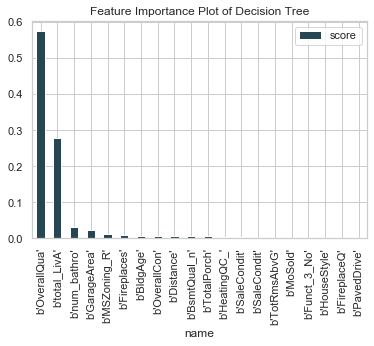

In [108]:
# Decision Tree Model
tree_reg = DecisionTreeRegressor(max_depth=8).fit(X_train,y_train)
print(f'R^2 of Train set: {tree_reg.score(X_train,y_train)}')
print(f'R^2 Test set: {tree_reg.score(X_test,y_test)}')
plt.figure(figsize = (17,10))
feature_importance_tree = list(zip(X_train.columns ,tree_reg.feature_importances_))
dtype = [('feature', 'S10'), ('importance', 'float')]
feature_importance_tree = np.array(feature_importance_tree, dtype=dtype)
feature_sort_tree = np.sort(feature_importance_tree, order = 'importance')[::-1]
name, score = zip(*list(feature_sort_tree))
print(pd.DataFrame(feature_sort_tree[:20]))
pd.DataFrame({'name':name,'score':score})[:20].plot.bar(x='name', y='score')
plt.title('Feature Importance Plot of Decision Tree')


from sklearn.model_selection import GridSearchCV
grid_para_tree = [{
    "criterion": ['mse'],
    "min_samples_leaf": range(1, 10),
    "min_samples_split": np.linspace(start=2, stop=30, num=15, dtype=int)
}]
tree_reg.set_params(random_state=42)
grid_search_tree = GridSearchCV(tree_reg, grid_para_tree, cv=10, scoring='r2', n_jobs=-1)
%time grid_search_tree.fit(X_train, y_train)

print(f'Grid Search Best Parameters: {grid_search_tree.best_params_}')

print(f'Grid Search Best Scores: {grid_search_tree.best_score_}')

print(f'Grid Search R2 of Train set: {grid_search_tree.score(X_train,y_train)}')
print(f'Grid Search R2 of Test set: {grid_search_tree.score(X_test,y_test)}')

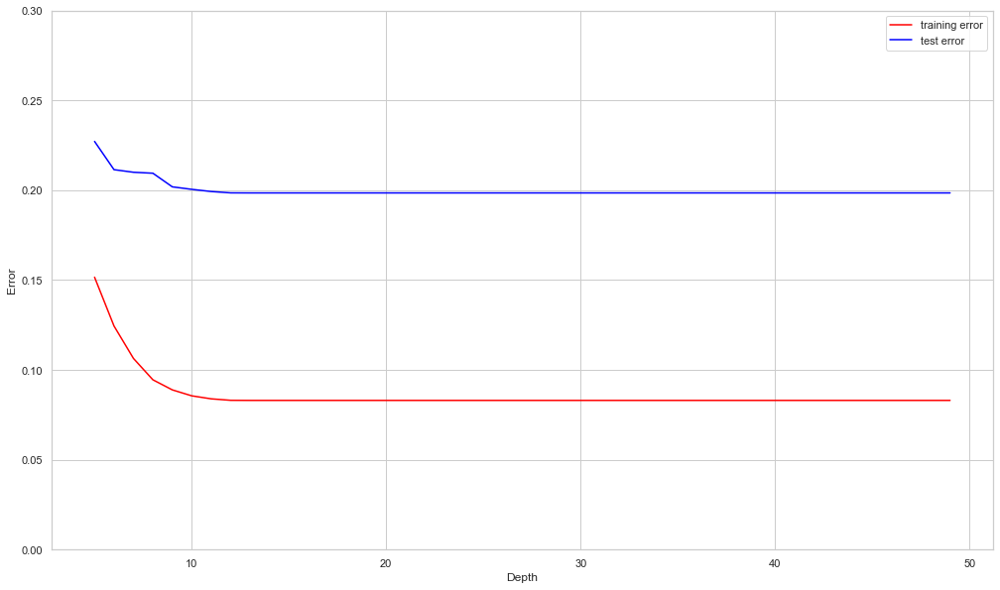

In [109]:
sns.set_style("whitegrid")
depth = range(5, 50)
train_error = []
test_error = []
for i in depth:
    tree_reg.set_params(max_depth=i, min_samples_leaf=9)
    tree_reg.fit(X_train, y_train)
    train_error.append(1 - tree_reg.score(X_train, y_train))
    test_error.append(1 - tree_reg.score(X_test, y_test))

plt.figure(figsize = (17,10))
plt.plot(depth, train_error, c='red', label='training error')
plt.plot(depth, test_error, c='blue', label='test error')
plt.ylim(0, 0.30)
plt.ylabel('Error')
plt.xlabel('Depth')
plt.legend()
plt.show()

### Random Forest Model

R^2 of Train set: 0.9832981784794597
R^2 Test set: 0.8211597655778335
          feature  importance
0   b'total_LivA'    0.128920
1   b'OverallQua'    0.087664
2   b'GarageArea'    0.070480
3      b'BldgAge'    0.065392
4   b'num_bathro'    0.055254
5   b'BsmtQual_n'    0.049037
6   b'KitchenQua'    0.045427
7   b'FireplaceQ'    0.036407
8   b'TotRmsAbvG'    0.034690
9   b'Fireplaces'    0.034439
10  b'TotalPorch'    0.032197
11  b'Foundation'    0.029651
12  b'HeatingQC_'    0.020817
13    b'Distance'    0.020533
14  b'GarageFini'    0.018557
15  b'OverallCon'    0.017835
16  b'GarageType'    0.017016
17  b'MSZoning_R'    0.013469
18  b'MasVnrArea'    0.013318
19  b'GarageType'    0.012310
CPU times: user 29.3 s, sys: 1.7 s, total: 31 s
Wall time: 1min 30s
Grid Search Best Parameters: {'criterion': 'mse', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}
Grid Search Best Scores: 0.8792817295203168
Grid Search R2 of Train set: 0.9830955549029718
Gr

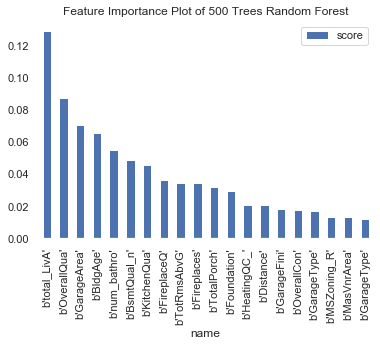

In [111]:
# Random Forest Model
forest_reg = RandomForestRegressor(n_estimators=100,max_features=5).fit(X_train,y_train)
print(f'R^2 of Train set: {forest_reg.score(X_train,y_train)}')
print(f'R^2 Test set: {forest_reg.score(X_test,y_test)}')


feature_importance_forest = list(zip(X_train.columns, forest_reg.feature_importances_))
feature_importance_forest = np.array(feature_importance_forest, dtype=dtype)
feature_sort_forest = np.sort(feature_importance_forest, order='importance')[::-1]
name, score = zip(*list(feature_sort_forest))
print(pd.DataFrame(feature_sort_forest[:20]))
pd.DataFrame({'name':name,'score':score})[:20].plot.bar(x='name', y='score')
plt.title('Feature Importance Plot of 500 Trees Random Forest')

sns.set_style("whitegrid")
grid_para_forest = [{
    "n_estimators": [25,50,100],
    "criterion": ["mse"],
    "min_samples_leaf": range(1, 10),
    "min_samples_split": np.linspace(start=2, stop=30, num=15, dtype=int),
    "random_state": [42]}]
grid_search_forest = GridSearchCV(forest_reg, grid_para_forest, cv=10, scoring='r2', n_jobs=-1)
%time grid_search_forest.fit(X_train, y_train)

print(f'Grid Search Best Parameters: {grid_search_forest.best_params_}')

print(f'Grid Search Best Scores: {grid_search_forest.best_score_}')

print(f'Grid Search R2 of Train set: {grid_search_forest.score(X_train,y_train)}')
print(f'Grid Search R2 of Test set: {grid_search_forest.score(X_test,y_test)}')

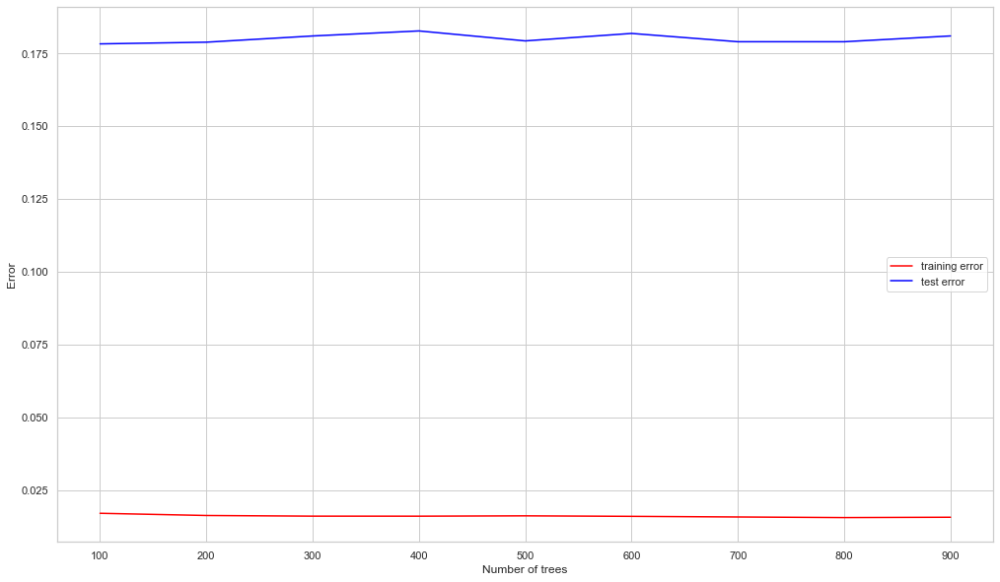

In [112]:
n_trees_range = range(100, 1000, 100)  # OOB score will warning if too few trees
train_error2 = []
test_error2 = []

sns.set_style("whitegrid")
for n_trees in n_trees_range:
    forest_reg.set_params(n_estimators=n_trees)
    forest_reg.fit(X_train, y_train)
    train_error2.append(1 - forest_reg.score(X_train, y_train))
    test_error2.append(1 - forest_reg.score(X_test, y_test))
    
plt.figure(figsize = (17,10))
plt.plot(n_trees_range, train_error2, c='red', label='training error')
plt.plot(n_trees_range, test_error2, c='blue', label='test error')
plt.ylabel('Error')
plt.xlabel('Number of trees')
plt.legend()
plt.show()

###  Gradient Boosting Model

R^2 of Train set: 0.17731437608580825
R^2 Test set: 0.15184788172704156
                    0         1
0         OverallQual  0.383076
1       total_LivArea  0.359307
2          GarageArea  0.054201
3     FireplaceQu_num  0.032072
4             BldgAge  0.030127
5     KitchenQual_num  0.024112
6         OverallCond  0.018578
7        num_bathroom  0.011860
8         MSZoning_RM  0.011799
9        CentralAir_Y  0.011017
10         Fireplaces  0.007108
11       TotRmsAbvGrd  0.006971
12       TotalPorchSF  0.006776
13        MSZoning_RL  0.006041
14  GarageType_Attchd  0.004861
15       BsmtQual_num  0.004315
16     GarageCond_num  0.004168
17           Distance  0.004092
18      HeatingQC_num  0.004044
19       PavedDrive_Y  0.002125


Text(0.5, 1.0, 'Feature Importance Plot of 1000-Tree GBM')

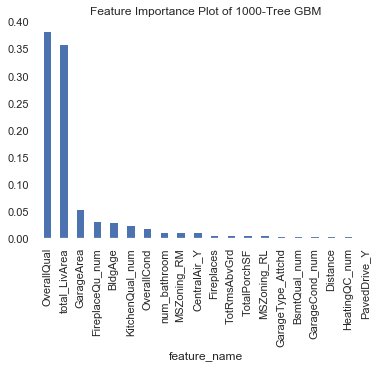

In [55]:
# Gradient Boosting Model
sns.set_style("whitegrid")
from sklearn.ensemble import GradientBoostingRegressor
gbm = GradientBoostingRegressor().fit(X_train,y_train)
gbm.set_params(learning_rate=0.01, n_estimators=5000, verbose=1, warm_start=False,loss='ls',max_features=2, min_impurity_decrease=0.01)

print(f'R^2 of Train set: {gbm.score(X_train,y_train)}')
print(f'R^2 Test set: {gbm.score(X_test,y_test)}')


sorted_importance_gbm = sorted(zip(X_train.columns, gbm.feature_importances_), key=lambda t:t[1], reverse=True)
print(pd.DataFrame(sorted_importance_gbm[:20]))
a, b = zip(*sorted_importance_gbm[:20]) # this splits the list of tuples into two lists
pd.DataFrame({'feature_name':a, 'importance_score':b}).plot.bar(x='feature_name',y='importance_score', legend=None)
plt.title('Feature Importance Plot of 1000-Tree GBM')


### Lasso Regression

In [260]:
reg_lasso_cv = LassoCV(normalize = True, n_alphas = 200)
reg_lasso_cv.fit(X_train, y_train)
print(reg_lasso_cv.alpha_)

reg_lasso = Lasso(normalize=True)
reg_lasso.set_params(alpha = 2.846e-05)
reg_lasso.fit(X_train, y_train)
lasso_coef_df = pd.DataFrame({'feature':X_train.columns,
                              'coef':reg_lasso.coef_})
lasso_coef_df[lasso_coef_df['coef']>0]

3.158590218274496e-05


,feature,coef
2,OverallQual,0.068616
3,OverallCond,0.036761
4,TotRmsAbvGrd,0.028648
5,Fireplaces,0.043930
6,GarageArea,0.000215
8,MasVnrArea2,0.007217
9,total_LivArea,0.290148
10,num_bathroom,0.018246
15,HillORDepr,0.048925
16,PosFeat,0.016757


# Conclusions and Recommendations

- Linear regression model may be better at predicting Ames housing prices
- Housing price at Ames, Iowa is stable from 2006 to 2010
- We recommend that home buyers focus on the overall quality (overall material and finish) of the house first and foremost in order to maximize profit